# Exercise 1 - Static Charts with Python

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statistics 
from scipy.stats import iqr
import scipy as sci
from plotly.graph_objs import *
import scipy.stats as st


In [105]:
# load csv file
#df_confirmed = pd.read_csv('data/time_series_covid_19_confirmed.csv')

df = pd.read_csv('data/COVID19_open_line_list.csv')

In [106]:
df = df.drop(['ID','wuhan(0)_not_wuhan(1)','geo_resolution','lives_in_Wuhan','travel_history_dates','date_onset_symptoms','date_admission_hospital',
                'travel_history_location','reported_market_exposure','additional_information','chronic_disease_binary','age','sex',
                'chronic_disease','sequence_available','outcome','date_death_or_discharge','notes_for_discussion','location','admin3','admin2','admin1',
               'admin_id','data_moderator_initials','Unnamed: 33','Unnamed: 34','Unnamed: 35','Unnamed: 36','Unnamed: 37','Unnamed: 38','Unnamed: 39','Unnamed: 40'
                      ,'Unnamed: 41','Unnamed: 42','Unnamed: 43','Unnamed: 44','source','symptoms','country_new'], axis = 1) 

In [108]:
df = df[(~df.latitude.isna()) & (~df.date_confirmation.isna()) & (~df.city.isna()) & (~df.province.isna()) & (~df.country.isna()) & (df.country == 'China')]

In [24]:
europe_countries = ['Kosovo','Albania','Austria','Belarus','Belgium','Bosnia and Herzegovina','Croatia',
                   'Cyprus','Czechia','Denmark','Estonia','Finland','France','Germany','Greece','Hungary'
                   'Holy See','Iceland','Ireland','Italy','Latvia','Liechtenstein','Lithuania','Luxembourg','Malta',
                   'Moldova','Monaco','Montenegro','Netherlands','North Macedonia','Norway','Poland','Portugal',
                   'Romania','San Marino','Serbia','Slovakia','Slovenia','Spain','Sweden','Switzerland','Ukraine',
                   'United Kingdom','']
dfeurope = df_confirmed[df_confirmed['Country/Region'].isin(europe_countries)]
dfeurope = dfeurope[dfeurope['Province/State'].isin([np.nan])]


In [257]:
balkan_countries = ['Kosovo','Albania','Croatia','Bosnia and Herzegovina','Slovenia','Bulgaria','Montenegro',
                   'Serbia','Greece','Romania','Hungary','North Macedonia']
dfbalkans = df_confirmed[df_confirmed['Country/Region'].isin(balkan_countries)]
dfbalkans = dfbalkans.drop(['1/22/20','1/23/20','1/24/20','1/25/20','1/26/20',
                '1/27/20','1/28/20','1/29/20','1/30/20','1/31/20',
                '2/1/20','2/2/20','2/3/20','2/4/20','2/5/20','2/6/20','2/7/20','2/8/20','2/9/20','2/10/20',
               '2/11/20','2/12/20','2/13/20','2/14/20','2/15/20','2/16/20','2/17/20','2/18/20','2/19/20','2/20/20'
                      ,'2/21/20','2/22/20','2/23/20','2/24/20'], axis = 1) 


In [130]:
dfusa = pd.read_csv('data/time_series_covid_19_confirmed_US.csv')
dfusa = dfusa[5:3149]
dfusa = dfusa[dfusa.Province_State != 'Alaska']
dfusa = dfusa[dfusa.Province_State != 'Hawaii']

In [34]:
def twodkdeplot(region, date, dataset):
    if region == 'Balkans':
        img = plt.imread('balkans.png')
    elif region == 'Europe':
        img = plt.imread('europe.png')
    else:
        img = plt.imread('usa.png')
    BBox = (dataset.Long.min()-3,   dataset.Long.max()+3, dataset.Lat.min()-3, dataset.Lat.max()+3)
    long = []
    lat = []
    for i in range(0,len(dfeurope)):
        nr_of_cases = dataset.iloc[i][date]
        for j in range(0,nr_of_cases):
            long.append(dataset.iloc[i]['Long'])
            lat.append(dataset.iloc[i]['Lat'])
    fig, ax = plt.subplots(figsize = (8,7))
    ax = sns.kdeplot(long, lat, cmap="Reds", shade=True, shade_lowest=False, alpha= 0.65, kernel="triw", bw="silverman")
    ax.set_title('Plotting 2d KDE on '+region+' Map for '+ date)
    ax.set_xlim(BBox[0],BBox[1])
    ax.set_ylim(BBox[2],BBox[3])
    ax.imshow(img, zorder=0, extent = BBox, aspect= 'equal')

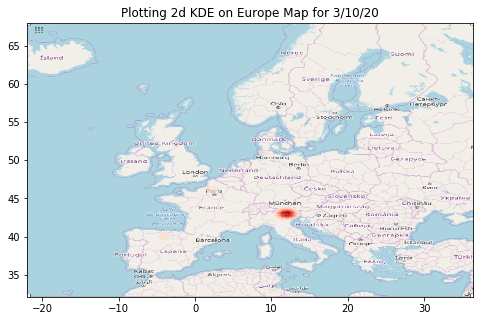

In [395]:
twodkdeplot('Europe','3/15/20',dfeurope)

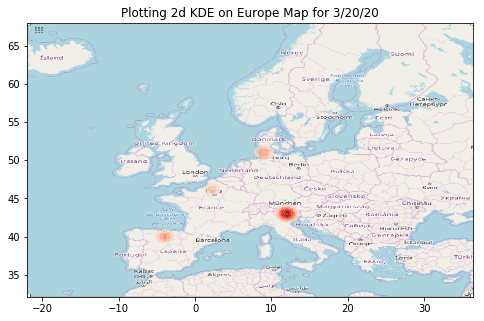

In [403]:
twodkdeplot('Europe','3/20/20',dfeurope)

## Paper implementation

The formula for kernel density width is $h= 0.9 \times min(\sigma, \frac{IQR}{1.34}) \times n^{-\frac{1}{5}}$

In [11]:
#kernel density width
def get_kernel_denstiy_width(dataset_sample):
    sd = statistics.stdev(dataset_sample)
    iqr_val = iqr(dataset_sample, rng=(25,75), interpolation='midpoint')
    n = len(dataset_sample)
    return 0.9*min(sd, (iqr_val/1.34))*n**(-0.2)

The formula for density estimate is $f_{2D}(x,y) = \frac{1}{N} \sum_{i=1}^{N} \frac{1}{h_{s,i}^2}K_s (\frac{x-x_i}{h_{s,i}}, \frac{y-y_i}{h_{s,i}})$ and for triweight kernel is $K_{s,t}(u) = \frac{35}{32} (1-u^2)^3$

$f_{2D}(x,y) = \frac{1}{N} \sum_{i=1}^{N} \frac{1}{h_{s,i}^2}K_s (\frac{x-x_i}{h_{s,i}}) \times K_s( \frac{y-y_i}{h_{s,i}})$

In [5]:
cubehelix_cs=[[0.0, 'rgba(255, 255, 255, 0)'],
              [0.1, 'rgba(227,242,253, 0.4)'],
              [0.2, 'rgba(187,222,251, 0.7)'],
              [0.3, 'rgba(144,202,249, 0.7)'],
              [0.4, 'rgba(100,181,246, 0.7)'],
              [0.5, 'rgba(66,165,245, 0.7)'],
              [0.6, 'rgba(30,136,229, 0.7)'],
              [0.7, 'rgba(25,118,210, 0.7)'],
              [0.8, 'rgba(21,101,192, 0.7)'],
              [0.9, 'rgba(13,71,161, 0.7)'],
              [1.0, 'rgba(8,50,135, 0.7)']]

In [77]:
def weighted_gaussian_kde(dataset, weights, points):
    d, n = dataset.shape
    
    if weights is not None:
        weights = weights / np.sum(weights)
    else:
        weights = np.ones(n) / n
    
    neff = 1.0 / np.sum(weights ** 2)
    covariance_factor = np.power(neff*(d+2.0)/4.0, -1./(d+4))
        
    #compute covariance
    _mean = np.sum(weights * dataset, axis=1)
    _residual = (dataset - _mean[:, None])
    _data_covariance = np.atleast_2d(np.dot(_residual * weights, _residual.T))
    _data_covariance /= (1 - np.sum(weights ** 2))
    _data_inv_cov = np.linalg.inv(_data_covariance)
    covariance = _data_covariance * covariance_factor**2
    inv_cov = _data_inv_cov / covariance_factor**2
    #Gaussian norm factor
    #_norm_factor = np.sqrt(np.linalg.det(2*np.pi*covariance))
    #Triweight norm factor
    _norm_factor = np.linalg.det(32*covariance/35)
    
    d1, m = points.shape

    result = np.array([0.0] * m)

    whitening = np.linalg.cholesky(inv_cov)
    scaled_dataset = np.dot(whitening, dataset)
    scaled_points = np.dot(whitening, points)

    for i in range(n):
        diff = scaled_dataset[:, i, np.newaxis] - scaled_points
        energy =  np.sum(diff * diff, axis=0) #/ 2.0
        #Gaussian result
        result += weights[i]*np.exp(-energy)
        #Triweight result
        #result += weights[i]*(1-energy)**3
        
    result = result / _norm_factor
    return result

In [78]:
def kde_scipy( vals1, vals2, a,b, c,d, N, weights = None):

    x=np.linspace(a,b,N)
    y=np.linspace(c,d,N)
    X,Y=np.meshgrid(x,y)
    positions = np.vstack([Y.ravel(), X.ravel()])

    values = np.vstack([vals1, vals2])
    
    kernel = weighted_gaussian_kde(values,weights,positions)
    
    
    Z = np.reshape(kernel.T, X.shape)

    return [x, y, Z]

In [125]:
 def make_kdeplot(varX, varY, a,b, c,d, N, colorsc, title, weights):
    x, y, Z = kde_scipy(varY, varX, a,b, c,d , N, weights)

    data = Data([
       Contour(z=Z, x=x, y=y, colorscale=colorsc, opacity=0.7, contours=Contours(showlines=False)),
     ])

    layout = Layout(
        title= title,
        font= Font(family='Georgia, serif',  color='#635F5D'),
        showlegend=False,
        autosize=False,
        width=650,
        height=650,
        xaxis=XAxis(range=[a,b],showgrid=False,nticks=7),
        yaxis=YAxis(range=[c,d],showgrid=False,nticks=7),
        margin=Margin(l=40,r=40,b=85,t=100,)
    )
    
    fig = Figure(data=data, layout=layout)
    fig.add_layout_image(
        dict(source="chinamap.png", xref="x", yref="y", x=a, y=d, sizex=b-a, sizey=d-c, sizing="stretch", opacity=1.0, layer="below")
    )

    return fig

In [129]:
givendate = '26.01.2020'
df1 = df[df.date_confirmation == givendate]
x=df1['longitude'].tolist()
y=df1['latitude'].tolist()

#weights = dfeurope['3/16/20'].tolist()
#GETTING X,Y MIN AND MAX
x_min=min(x)
x_max=max(x)
y_min=min(y)
y_max=max(y)


N=len(x)
make_kdeplot(x, y, x_min, x_max, y_min, y_max,
             N, cubehelix_cs,'Covid-19 in China on: ' + givendate, None)
